In [59]:
import uproot
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import umap
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from tqdm import tqdm
import torch.cuda.amp as amp

In [2]:
# Load datasets
# #paths to samples
zero_t_samples = [
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/WW.Flz.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/WW.Flz.part2.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part2.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part3.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part4.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part5.root',
]

one_t_samples = [
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_tbar_4f.leB.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_tbar_4f.leB.part2.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_top_4f.qlh.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_top_4f.qlh.part2.root',
]

two_t_samples = [
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part2.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part3.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part4.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_semilep.vRt.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_semilep.vRt.part2.root',
]

three_t_samples = [
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTJ_UL16Summer20_RoO.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTW_UL16Summer20_CgT.root',
]

four_t_samples = [
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part1.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part2.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part3.root',
    '/scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part4.root',
]

# create dataframe
total_data = []
for i, samples in tqdm(enumerate([zero_t_samples,one_t_samples,two_t_samples,three_t_samples,four_t_samples])):
    list_of_samples = []
    for path in tqdm(samples):
        print('processing',i, path)
        file = uproot.open(path)
        a = file['LHE'].arrays(file['LHE'].keys(), library="np")
        df = pd.DataFrame(a)
        df = df.loc[:, ~df.columns.str.startswith('SP_')]
        list_of_samples.append(df)
        print('successful')
    df_sample = pd.concat(list_of_samples).reset_index()
    df_sample['class'] = i
    total_data.append(df_sample)
data = pd.concat(total_data).reset_index()
data = data.drop(columns = ['level_0', 'index'])
print('shape:', data.shape)

0it [00:00, ?it/s]

processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/WW.Flz.part1.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/WW.Flz.part2.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part1.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part2.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part3.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part4.root


successful
processing 0 /scratch/pvolkov/DM/samples/MultiLepton/grid/Wjets-incl.INb.part5.root


100%|██████████| 7/7 [00:33<00:00,  4.71s/it]

successful



1it [00:46, 46.38s/it]

processing 1 /scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_tbar_4f.leB.part1.root


successful
processing 1 /scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_tbar_4f.leB.part2.root


successful
processing 1 /scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_top_4f.qlh.part1.root


successful
processing 1 /scratch/pvolkov/DM/samples/MultiLepton/grid/t-channel_top_4f.qlh.part2.root


100%|██████████| 4/4 [00:39<00:00,  9.85s/it]

successful



2it [01:43, 52.42s/it]

processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part1.root


successful
processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part2.root


successful
processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part3.root


successful
processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_doublelep.KQP.part4.root


successful
processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_semilep.vRt.part1.root


successful
processing 2 /scratch/pvolkov/DM/samples/MultiLepton/grid/ttbar_semilep.vRt.part2.root


100%|██████████| 6/6 [00:50<00:00,  8.35s/it]

successful



3it [02:55, 61.38s/it]

processing 3 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTJ_UL16Summer20_RoO.root


100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
4it [02:55, 37.44s/it]

successful
processing 3 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTW_UL16Summer20_CgT.root
successful


processing 4 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part1.root


successful
processing 4 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part2.root


successful
processing 4 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part3.root


successful
processing 4 /scratch/pvolkov/DM/samples/MultiLepton/grid/TTTT_UL16Summer20_eIE.part4.root


100%|██████████| 4/4 [00:08<00:00,  2.15s/it]

successful



5it [03:10, 38.00s/it]


shape: (8198428, 126)


In [3]:
df = data.groupby('class', group_keys=False).apply(lambda x: x.sample(frac=0.1, random_state=42))

/tmp/ipykernel_3139210/1042975793.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = data.groupby('class', group_keys=False).apply(lambda x: x.sample(frac=0.1, random_state=42))


In [4]:
df.shape

(819844, 126)

In [5]:
particle_types = {
    "BJet": 4,
    "Jet": 12,
    "Lep": 4
}

particle_features = ["Pt", "Eta", "Phi", "Px", "Py", "Pz"]

particle_cols = []
for p_type, count in particle_types.items():
    for i in range(1, count + 1):
        for feat in particle_features:
            col_name = f"{feat}_{p_type}{i}"
            particle_cols.append(col_name)

global_cols = ["N_J", "N_BJ", "N_Nu", "N_Lep", "MeT"]

label_col = "class"

In [6]:
train_df, val_df = train_test_split(df, test_size=0.2, shuffle=True, stratify=df['class'], random_state=42)

In [7]:
class TripletHEPDataset(Dataset):
    def __init__(self, df, label_col, particle_cols, global_cols, num_particles=20):
        self.df = df.reset_index(drop=True)
        self.label_col = label_col
        self.particle_cols = particle_cols
        self.global_cols = global_cols
        self.num_particles = num_particles
        self.label_groups = self.df.groupby(label_col).groups
        self.labels = self.df[label_col].values

    def __len__(self):
        return len(self.df)

    def get_triplet(self, anchor_idx):
        anchor_label = self.labels[anchor_idx]
        positive_pool = list(self.label_groups[anchor_label])
        positive_idx = np.random.choice([i for i in positive_pool if i != anchor_idx])

        negative_labels = [lbl for lbl in self.label_groups if lbl != anchor_label]
        negative_label = np.random.choice(negative_labels)
        negative_idx = np.random.choice(self.label_groups[negative_label])

        return anchor_idx, positive_idx, negative_idx

    def __getitem__(self, idx):
        a_idx, p_idx, n_idx = self.get_triplet(idx)

        def extract_features(row_idx):
            row = self.df.iloc[row_idx]
            particles = row[self.particle_cols].values.reshape(self.num_particles, -1)
            global_feats = row[self.global_cols].values
            return torch.tensor(particles, dtype=torch.float32), torch.tensor(global_feats, dtype=torch.float32)

        return tuple(extract_features(i) for i in (a_idx, p_idx, n_idx))

In [8]:
class ParticleMasker(nn.Module):
    def __init__(self, particle_input_dim=6):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Linear(particle_input_dim, particle_input_dim),
            nn.ReLU(),
            nn.Dropout(p=0.1)
        )
        
    def forward(self, particles):
        # particles: [batch, num_particles, 6]
        mask = (particles.abs().sum(dim=-1, keepdim=True) != 0).float()  # [B, N, 1]
        projected = self.proj(particles * mask)
        return {
            "masked_particles": projected,
            "mask": mask  # [B, N, 1]
        }

class GlobalProcessor(nn.Module):
    def __init__(self, input_dim=5, hidden_dim=16):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU()
        )
        
    def forward(self, global_feats):
        return self.net(global_feats)

class EventEncoder(nn.Module):
    def __init__(self, num_particles=20, particle_dim=6, global_dim=5, emb_dim=64):
        super().__init__()
        self.particle_masker = ParticleMasker(particle_dim)
        self.global_processor = GlobalProcessor(global_dim)
        
        self.particle_encoder = nn.Sequential(
            nn.Linear(particle_dim, 64),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(64, 32),
            nn.LayerNorm(32)
        )
        
        self.particle_attn = nn.MultiheadAttention(embed_dim=32, num_heads=4, batch_first=True)
        
        self.final_proj = nn.Linear(32 + 16, emb_dim)
        
    def forward(self, x):
        global_feats = x["global"]
        particles = x["particles"]
        
        particle_out = self.particle_masker(particles)
        masked_particles = particle_out["masked_particles"]
        mask = particle_out["mask"].squeeze(-1)  # [B, N]
        
        encoded_particles = self.particle_encoder(masked_particles)  # [B, N, 32]
        
        attn_out, _ = self.particle_attn(
            encoded_particles, encoded_particles, encoded_particles,
            key_padding_mask=~mask.bool()
        )
        
        masked_attn = attn_out * mask.unsqueeze(-1)
        particle_pooled = masked_attn.sum(dim=1) / (mask.sum(dim=1, keepdim=True) + 1e-6)
        
        global_emb = self.global_processor(global_feats)
        
        combined = torch.cat([particle_pooled, global_emb], dim=1)
        
        return F.normalize(self.final_proj(combined), dim=-1)

In [9]:
def triplet_loss(anchor, positive, negative, margin=1.0):
    d_ap = F.pairwise_distance(anchor, positive)
    d_an = F.pairwise_distance(anchor, negative)
    return F.relu(d_ap - d_an + margin).mean()

def train_encoder_model(model, train_dataset, val_dataset, config):
    device = config["device"]
    model = model.to(device)
    print(f'model is located on {next(model.parameters()).device}')
    optimizer = torch.optim.Adam(model.parameters(), lr=config["lr"])

    train_loader = DataLoader(train_dataset, batch_size=config["batch_size"], shuffle=True, num_workers=6, pin_memory=6)
    val_loader = DataLoader(val_dataset, batch_size=config["batch_size"], shuffle=False, num_workers=6, pin_memory=6)

    best_val_loss = float("inf")
    train_losses, val_losses = [], []

    for epoch in range(config["epochs"]):
        model.train()
        total_loss = 0
        for (pa, ga), (pp, gp), (pn, gn) in tqdm(train_loader):
            pa, ga = pa.to(device), ga.to(device)
            pp, gp = pp.to(device), gp.to(device)
            pn, gn = pn.to(device), gn.to(device)

            anchor = model({"particles": pa, "global": ga})
            positive = model({"particles": pp, "global": gp})
            negative = model({"particles": pn, "global": gn})

            loss = triplet_loss(anchor, positive, negative, margin=config["margin"])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_train_loss = total_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (pa, ga), (pp, gp), (pn, gn) in val_loader:
                pa, ga = pa.to(device), ga.to(device)
                pp, gp = pp.to(device), gp.to(device)
                pn, gn = pn.to(device), gn.to(device)

                anchor = model({"particles": pa, "global": ga})
                positive = model({"particles": pp, "global": gp})
                negative = model({"particles": pn, "global": gn})
                loss = triplet_loss(anchor, positive, negative, margin=config["margin"])
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"[{epoch+1}] Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), config["model_save_path"])
            print(">> Best model saved.")

    plt.figure(figsize=(8, 5))
    plt.plot(train_losses, label="Train")
    plt.plot(val_losses, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Triplet Loss")
    plt.title("Encoder Training Curve")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(config["loss_plot_path"])
    plt.close()

In [10]:
model = EventEncoder(
    num_particles=20,
    particle_dim=6,
    global_dim=5,
    emb_dim=64
)
weights_path = './models/jubest_encoder.pt'
state_dict = torch.load(weights_path)
model.load_state_dict(state_dict)
train_dataset = TripletHEPDataset(train_df, label_col, particle_cols, global_cols, num_particles=20)
val_dataset = TripletHEPDataset(val_df, label_col, particle_cols, global_cols, num_particles=20)

In [12]:
model.to('cuda')

EventEncoder(
  (particle_masker): ParticleMasker(
    (proj): Sequential(
      (0): Linear(in_features=6, out_features=6, bias=True)
      (1): ReLU()
      (2): Dropout(p=0.1, inplace=False)
    )
  )
  (global_processor): GlobalProcessor(
    (net): Sequential(
      (0): Linear(in_features=5, out_features=16, bias=True)
      (1): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
      (2): GELU(approximate='none')
      (3): Dropout(p=0.1, inplace=False)
      (4): Linear(in_features=16, out_features=16, bias=True)
      (5): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
      (6): GELU(approximate='none')
    )
  )
  (particle_encoder): Sequential(
    (0): Linear(in_features=6, out_features=64, bias=True)
    (1): GELU(approximate='none')
    (2): Dropout(p=0.1, inplace=False)
    (3): Linear(in_features=64, out_features=32, bias=True)
    (4): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
  )
  (particle_attn): MultiheadAttention(
    (out_proj): NonDynamicall

In [14]:
config = {
    'device': 'cuda',
    'lr': 1e-4,
    'batch_size': 256,
    'epochs': 20,
    'margin': 1.0,
    'num_workers': 6,
    'model_save_path': 'jubest_encoder.pt',
    'loss_plot_path': 'triplet_loss.png'
}
# train_encoder_model(encoder, train_dataset, val_dataset, config)

In [15]:
val_loader = DataLoader(val_dataset, batch_size=config["batch_size"], shuffle=False, num_workers=6, pin_memory=6)

In [20]:
with torch.no_grad():
    embeddings = []
    for (pa, ga), _, _ in tqdm(val_loader):
        pa, ga = pa.to('cuda'), ga.to('cuda')
        embed = model({"particles": pa, "global": ga})
        pa.to('cpu'), ga.to('cpu')
        embed.to('cpu')
        embed = embed.cpu().numpy()
        embeddings.extend(embed)
    val_df['embeddings'] = embeddings

100%|██████████| 641/641 [03:22<00:00,  3.16it/s]


In [49]:
embeddings = np.vstack(val_df['embeddings'].values)
embeddings.shape

(163969, 64)

In [53]:
reducer_2d = umap.UMAP(
    n_components=2,
    n_neighbors=15,       # баланс между локальной/глобальной структурой
    min_dist=0.1,         # плотность кластеров
    metric='cosine',      # метрика расстояния (euclidean, cosine, etc.)
    random_state=42
)
reducer_3d = umap.UMAP(n_components=3, random_state=42)


embedding_2d = reducer_2d.fit_transform(embeddings)
embedding_3d = reducer_3d.fit_transform(embeddings)

/hep/home/vasil/.local/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/hep/home/vasil/.local/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


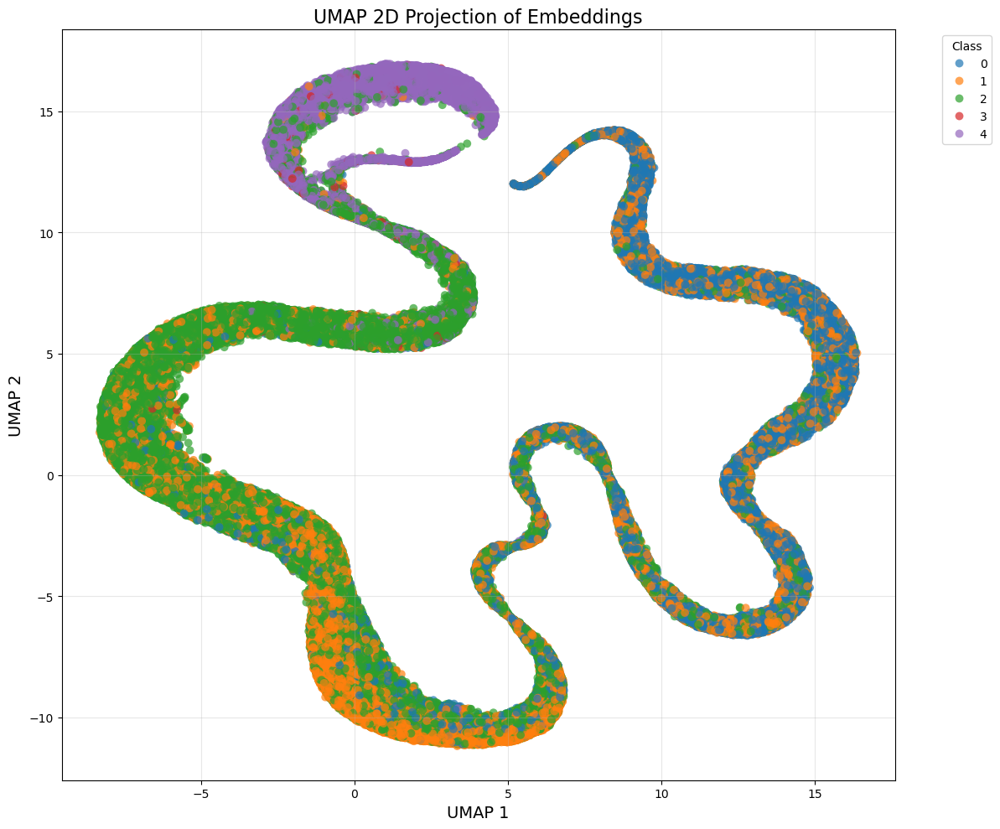

In [54]:
palette = [
    "#1f77b4",  # Синий (Matplotlib default)
    "#ff7f0e",  # Оранжевый
    "#2ca02c",  # Зелёный
    "#d62728",  # Красный
    "#9467bd",  # Фиолетовый
]

plt.figure(figsize=(12, 10))
sns.scatterplot(
    x=embedding_2d[:, 0],
    y=embedding_2d[:, 1],
    hue=val_df['class'],
    palette=palette,
    alpha=0.7,
    s=50,
    edgecolor='none'
)
plt.title("UMAP 2D Projection of Embeddings", fontsize=16)
plt.xlabel("UMAP 1", fontsize=14)
plt.ylabel("UMAP 2", fontsize=14)
plt.legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('umap_2d.png', dpi=300, bbox_inches='tight')
plt.show()

In [62]:
fig = px.scatter_3d(
    x=embedding_3d[:, 0],
    y=embedding_3d[:, 1],
    z=embedding_3d[:, 2],
    color=val_df['class'],
   
    title="3D UMAP Projection of Embeddings",
    labels={'x': 'UMAP 1', 'y': 'UMAP 2', 'z': 'UMAP 3'},
    opacity=0.7,
    width=1000,
    height=800
)

fig.update_layout(
    scene=dict(
        xaxis=dict(backgroundcolor="rgb(245, 245, 245)"),
        yaxis=dict(backgroundcolor="rgb(245, 245, 245)"),
        zaxis=dict(backgroundcolor="rgb(245, 245, 245)"),
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

fig.write_html("umap_3d_interactive.html")
fig.show()